## Basic Data Understanding

In [402]:
import pandas as pd
import numpy as np
import seaborn as sb
import math
import matplotlib.pyplot as plt
data = pd.read_csv ("/Users/vikassharma/Desktop/new_dataset.csv")

<AxesSubplot:title={'center':'Missing Data Map'}>

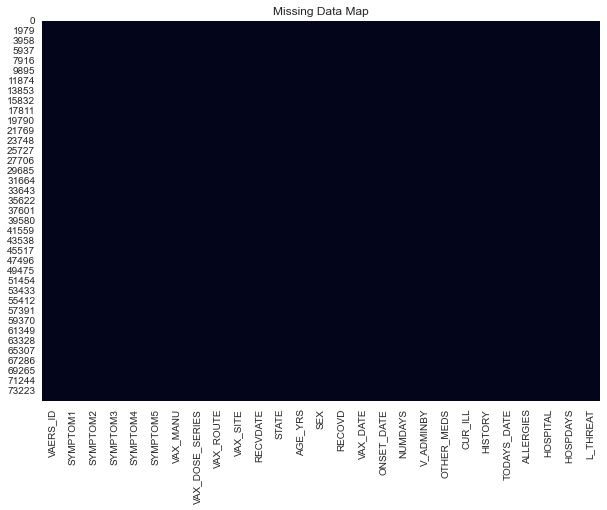

In [403]:
plt.rcParams['figure.figsize'] = (10,7)
plt.title('Missing Data Map')
sb.heatmap(data.isnull(), cbar=False)

In [404]:
data.head()

,VAERS_ID,SYMPTOM1,SYMPTOM2,SYMPTOM3,SYMPTOM4,SYMPTOM5,VAX_MANU,VAX_DOSE_SERIES,VAX_ROUTE,VAX_SITE,...,NUMDAYS,V_ADMINBY,OTHER_MEDS,CUR_ILL,HISTORY,TODAYS_DATE,ALLERGIES,HOSPITAL,HOSPDAYS,L_THREAT
0,916600,Dysphagia,Epiglottitis,No more Symptoms,No more Symptoms,No more Symptoms,MODERNA,1,IM,LA,...,2,PVT,Na,None,None,01/01/21,Pcn and bee venom,Not Hospitalized,0,0
1,916601,Anxiety,Dyspnoea,No more Symptoms,No more Symptoms,No more Symptoms,MODERNA,1,IM,RA,...,0,SEN,Patient residing at nursing facility. See pati...,Patient residing at nursing facility. See pati...,Patient residing at nursing facility. See pati...,01/01/21,"""Dairy""",Not Hospitalized,0,0
2,916602,Chest discomfort,Dysphagia,Pain in extremity,Visual impairment,No more Symptoms,PFIZER\BIONTECH,1,IM,LA,...,0,SEN,Na,None,None,01/01/21,Shellfish,Not Hospitalized,0,0
3,916603,Dizziness,Fatigue,Mobility decreased,No more Symptoms,No more Symptoms,MODERNA,1,IM,LA,...,0,WRK,Na,kidney infection,"diverticulitis, mitral valve prolapse, osteoar...",01/01/21,"Diclofenac, novacaine, lidocaine, pickles, tom...",Not Hospitalized,0,0
4,916604,Injection site erythema,Injection site pruritus,Injection site swelling,Injection site warmth,No more Symptoms,MODERNA,1,IM,LA,...,7,PUB,Na,Na,None,01/01/21,Na,Not Hospitalized,0,0


In [405]:
data.tail()

,VAERS_ID,SYMPTOM1,SYMPTOM2,SYMPTOM3,SYMPTOM4,SYMPTOM5,VAX_MANU,VAX_DOSE_SERIES,VAX_ROUTE,VAX_SITE,...,NUMDAYS,V_ADMINBY,OTHER_MEDS,CUR_ILL,HISTORY,TODAYS_DATE,ALLERGIES,HOSPITAL,HOSPDAYS,L_THREAT
75176,1004565,Migraine,No more Symptoms,No more Symptoms,No more Symptoms,No more Symptoms,PFIZER\BIONTECH,1,OT,RA,...,1,UNK,Na,None,Medical History/Concurrent Conditions: Asthma;...,02/04/21,None,Not Hospitalized,0,0
75177,1004566,Vaccination site haemorrhage,No more Symptoms,No more Symptoms,No more Symptoms,No more Symptoms,PFIZER\BIONTECH,1,OT,LA,...,0,UNK,Na,None,Medical History/Concurrent Conditions: Blood p...,02/04/21,None,Not Hospitalized,0,0
75178,1004567,Feeling cold,Paraesthesia,Vaccination site pain,No more Symptoms,No more Symptoms,PFIZER\BIONTECH,1,OT,LA,...,0,UNK,Na,None,Medical History/Concurrent Conditions: Anxiety...,02/04/21,None,Not Hospitalized,0,0
75179,1004568,Chest pain,Hypoaesthesia,No more Symptoms,No more Symptoms,No more Symptoms,PFIZER\BIONTECH,1,OT,RA,...,2,UNK,Na,None,None,02/04/21,None,Not Hospitalized,0,0
75180,1004569,Body temperature,Chills,Injection site erythema,Injection site swelling,Injection site warmth,PFIZER\BIONTECH,2,OT,LA,...,1,PVT,Na,None,Medical History/Concurrent Conditions: Sulfona...,02/04/21,None,Not Hospitalized,0,0


In [406]:
data.shape

(75181, 27)

In [407]:
data.describe()

,VAERS_ID,AGE_YRS,HOSPDAYS
count,7.518100e+04,75181.000000,75181.000000
mean,9.597451e+05,48.098048,0.040010
std,2.508938e+04,16.199055,0.491909
min,9.166000e+05,0.080000,0.000000
25%,9.377000e+05,36.000000,0.000000
50%,9.598380e+05,48.000000,0.000000
75%,9.813100e+05,58.000000,0.000000
max,1.004569e+06,119.000000,26.000000


In [408]:
data.columns

Index(['VAERS_ID', 'SYMPTOM1', 'SYMPTOM2', 'SYMPTOM3', 'SYMPTOM4', 'SYMPTOM5',
       'VAX_MANU', 'VAX_DOSE_SERIES', 'VAX_ROUTE', 'VAX_SITE', 'RECVDATE',
       'STATE', 'AGE_YRS', 'SEX', 'RECOVD', 'VAX_DATE', 'ONSET_DATE',
       'NUMDAYS', 'V_ADMINBY', 'OTHER_MEDS', 'CUR_ILL', 'HISTORY',
       'TODAYS_DATE', 'ALLERGIES', 'HOSPITAL', 'HOSPDAYS', 'L_THREAT'],
      dtype='object')

In [409]:
data.nunique()

VAERS_ID           75181
SYMPTOM1            1606
SYMPTOM2            1669
SYMPTOM3            1507
SYMPTOM4            1315
SYMPTOM5            1180
VAX_MANU               3
VAX_DOSE_SERIES        3
VAX_ROUTE              8
VAX_SITE              11
RECVDATE              36
STATE                 59
AGE_YRS              115
SEX                    3
RECOVD                 3
VAX_DATE             193
ONSET_DATE           132
NUMDAYS              141
V_ADMINBY              9
OTHER_MEDS         34787
CUR_ILL             7463
HISTORY            21961
TODAYS_DATE           68
ALLERGIES          18961
HOSPITAL               2
HOSPDAYS              23
L_THREAT               2
dtype: int64

In [410]:
covid_data = data

In [411]:
covid_data.dtypes

VAERS_ID             int64
SYMPTOM1            object
SYMPTOM2            object
SYMPTOM3            object
SYMPTOM4            object
SYMPTOM5            object
VAX_MANU            object
VAX_DOSE_SERIES     object
VAX_ROUTE           object
VAX_SITE            object
RECVDATE            object
STATE               object
AGE_YRS            float64
SEX                 object
RECOVD              object
VAX_DATE            object
ONSET_DATE          object
NUMDAYS             object
V_ADMINBY           object
OTHER_MEDS          object
CUR_ILL             object
HISTORY             object
TODAYS_DATE         object
ALLERGIES           object
HOSPITAL            object
HOSPDAYS             int64
L_THREAT            object
dtype: object

## Univariate Analysis

#### total number of patients who recovered after the adverse effects of vaccinations

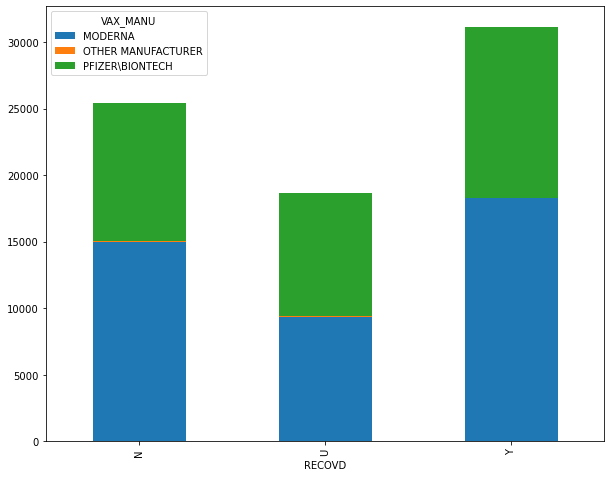

In [12]:
plt.rcParams['figure.figsize'] = (10,8)
pd.crosstab(covid_data["RECOVD"],covid_data["VAX_MANU"]).plot(kind='bar',stacked=True)
plt.show()

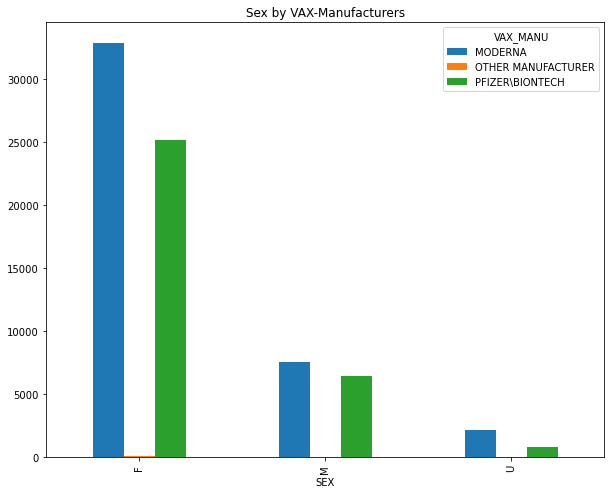

In [13]:
plt.rcParams['figure.figsize'] = (10,8)
pd.crosstab(covid_data["SEX"],covid_data["VAX_MANU"]).plot(kind='bar')
plt.title('Sex by VAX-Manufacturers')
plt.show()

In [14]:
##PRIVATE BODIES HAVE ADMINISTERED THE LARGEST AMOUNT OF VACCINATIONS OF MODERNA/PFIZER 

Text(0.5, 1.0, 'Type of Dept. Recieving Vaccinations')

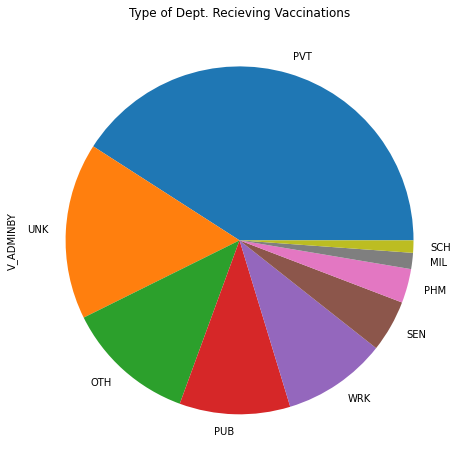

In [15]:
covid_data["V_ADMINBY"].value_counts().plot(kind='pie')
plt.title('Type of Dept. Recieving Vaccinations')

### Changing Age to categories in bins of 10

In [413]:
age_function = ["{0} - {1}".format(i, i + 9) for i in range(0, 100, 10)]
covid_data["AGE_YRS"] = pd.cut(covid_data.AGE_YRS, range(0, 105, 10), right=False, labels=age_function)


In [414]:
covid_data["AGE_YRS"]

0        30 - 39
1        70 - 79
2        20 - 29
3        50 - 59
4        40 - 49
          ...   
75176    30 - 39
75177    70 - 79
75178    30 - 39
75179    30 - 39
75180    50 - 59
Name: AGE_YRS, Length: 75181, dtype: category
Categories (10, object): ['0 - 9' < '10 - 19' < '20 - 29' < '30 - 39' ... '60 - 69' < '70 - 79' < '80 - 89' < '90 - 99']

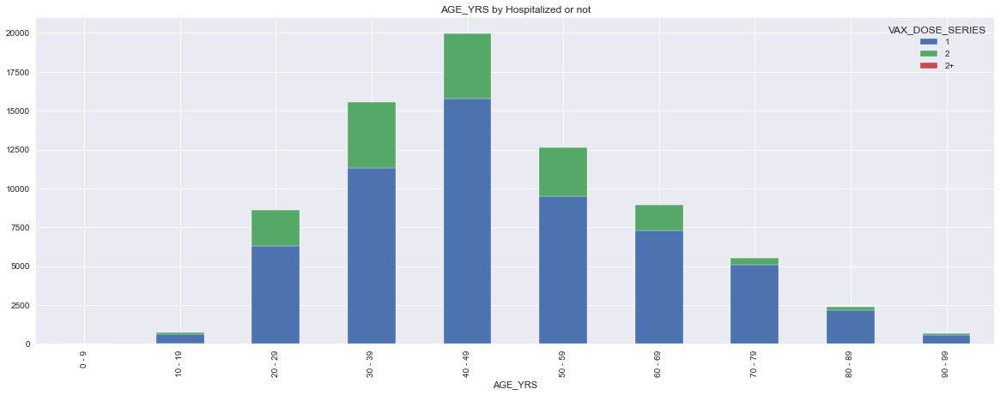

In [415]:
plt.rcParams['figure.figsize'] = (20,7)
pd.crosstab(covid_data["AGE_YRS"],covid_data["VAX_DOSE_SERIES"]).plot(kind='bar',stacked=True)
plt.title('AGE_YRS by Hospitalized or not')
plt.show()

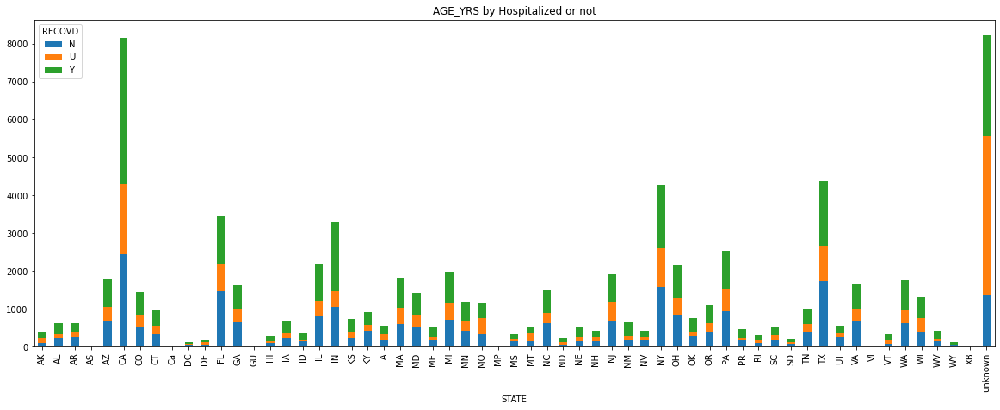

In [18]:
plt.rcParams['figure.figsize'] = (20,7)
pd.crosstab(covid_data["STATE"],covid_data["RECOVD"]).plot(kind='bar',stacked=True)
plt.title('AGE_YRS by Hospitalized or not')
plt.show()

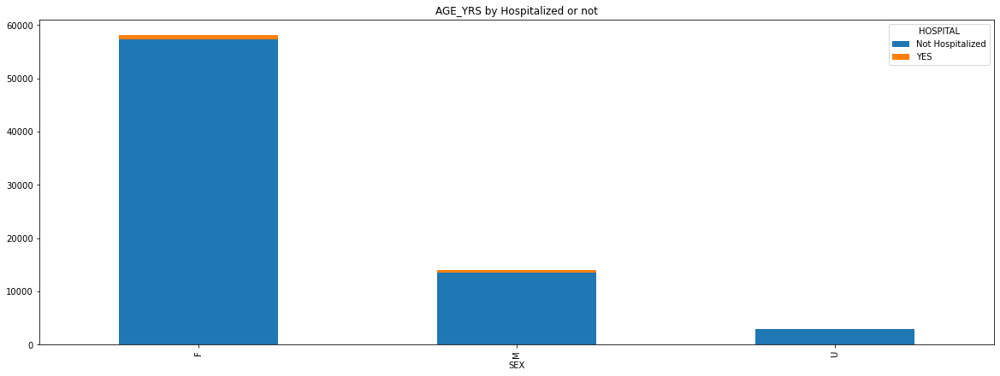

In [19]:
pd.crosstab(covid_data["SEX"],covid_data["HOSPITAL"]).plot(kind='bar',stacked=True)
plt.title('AGE_YRS by Hospitalized or not')
plt.show()

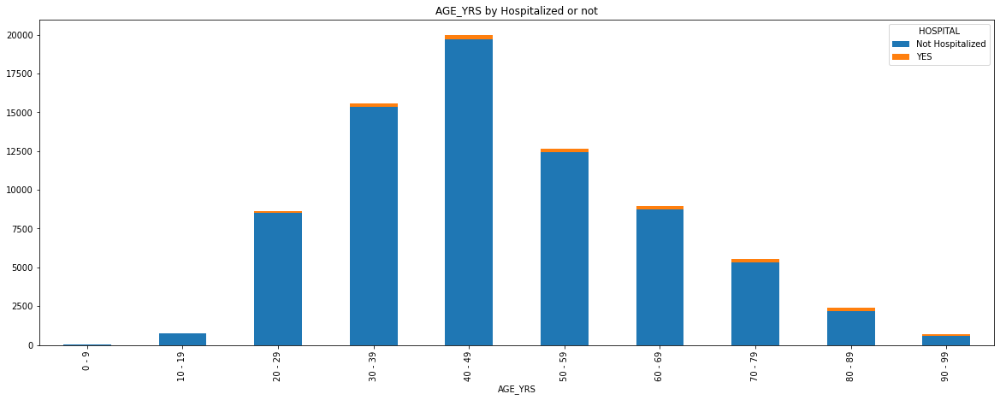

In [20]:
pd.crosstab(covid_data["AGE_YRS"],covid_data["HOSPITAL"]).plot(kind='bar',stacked=True)
plt.title('AGE_YRS by Hospitalized or not')
plt.show()

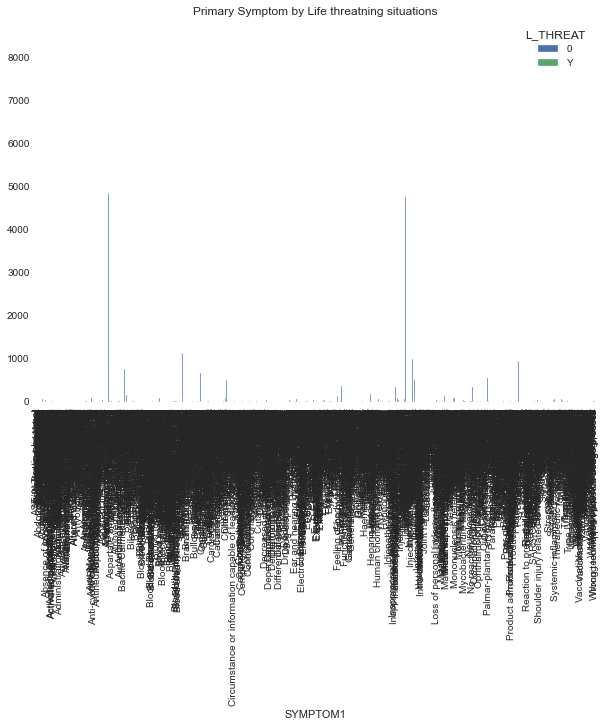

In [420]:
pd.crosstab(covid_data["SYMPTOM1"],covid_data["L_THREAT"]).plot(kind='bar',stacked=True)
plt.title('Primary Symptom by Life threatning situations')
plt.show()

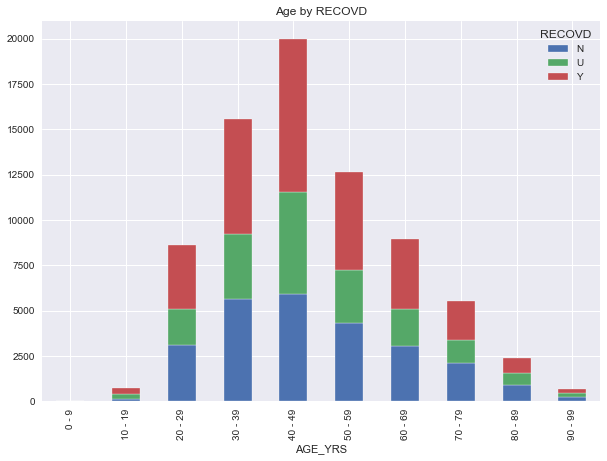

In [421]:
pd.crosstab(covid_data["AGE_YRS"],covid_data["RECOVD"]).plot(kind='bar',stacked=True)
plt.title('Age by RECOVD')
plt.show()

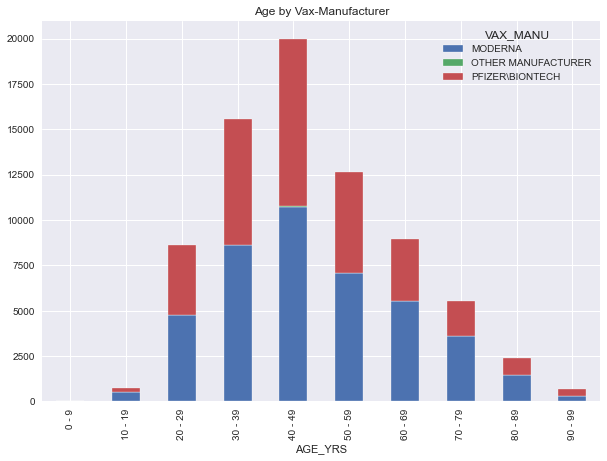

In [422]:
pd.crosstab(covid_data["AGE_YRS"],covid_data["VAX_MANU"]).plot(kind='bar',stacked=True)
plt.title('Age by Vax-Manufacturer')
plt.show()

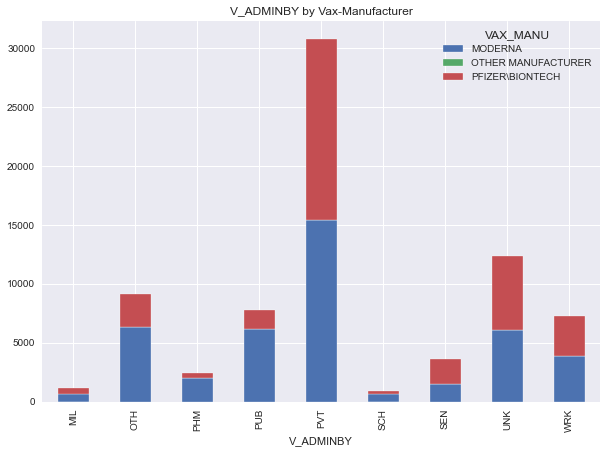

In [423]:
pd.crosstab(covid_data["V_ADMINBY"],covid_data["VAX_MANU"]).plot(kind='bar',stacked=True)
plt.title('V_ADMINBY by Vax-Manufacturer')
plt.show()

##Symptoms Analysis

In [22]:
import plotly.express as plotly_graph
import plotly.graph_objects as plotly_obj
s1_d1 = covid_data['SYMPTOM1'].value_counts()
v_symptom1 = pd.DataFrame({"SYMPTOM1":s1_d1[:10].keys(), "Count":s1_d1[:10].values})
fig1 = plotly_graph.bar(v_symptom1, x='SYMPTOM1', y="Count", title="Primary Symptoms of Vaccination Reactions")
fig1.show()

In [419]:
s2_d2 = covid_data['SYMPTOM2'].value_counts()
v_symptom2 = pd.DataFrame({"SYMPTOM2":s2_d2[:10].keys(), "Count":s2_d2[:10].values})
fig2 = plotly_graph.bar(v_symptom2, x='SYMPTOM2', y="Count",title="Secondary Symptoms (2) of Vaccination Reactions")
fig2.show()

In [24]:
s3_d3 = covid_data['SYMPTOM3'].value_counts()
v_symptom3 = pd.DataFrame({"SYMPTOM3":s3_d3[:10].keys(), "Count":s3_d3[:10].values})
fig3 = plotly_graph.bar(v_symptom3, x='SYMPTOM3', y="Count",title="Secondary Symptoms (3) of Vaccination Reactions")
fig3.show()

In [25]:
s4_d4 = covid_data['SYMPTOM4'].value_counts()
v_symptom4 = pd.DataFrame({"SYMPTOM4":s4_d4[:10].keys(), "Count":s4_d4[:10].values})
fig4 = plotly_graph.bar(v_symptom4, x='SYMPTOM4', y="Count",title="Secondary Symptoms (4) of Vaccination Reactions")
fig4.show()

In [26]:
s5_d5 = covid_data['SYMPTOM5'].value_counts()
v_symptom5 = pd.DataFrame({"SYMPTOM5":s5_d5[:10].keys(), "Count":s5_d5[:10].values})
fig5 = plotly_graph.bar(v_symptom5, x='SYMPTOM5', y="Count",title="Secondary Symptoms (5) of Vaccination Reactions")
fig5.show()

In [27]:
vaccination_route = covid_data['VAX_ROUTE'].value_counts()
v_route = pd.DataFrame({'Route':vaccination_route.keys(), 'Count': vaccination_route.values})
v_route_fig1 = plotly_graph.pie(v_route, values="Count", names="Route", title="Vaccination Route")
v_route_fig1.update_layout(
    title_text='Vaccination Route to Human Body',
    xaxis_title_text='Route', 
    yaxis_title_text='Count',
)
v_route_fig1.show()

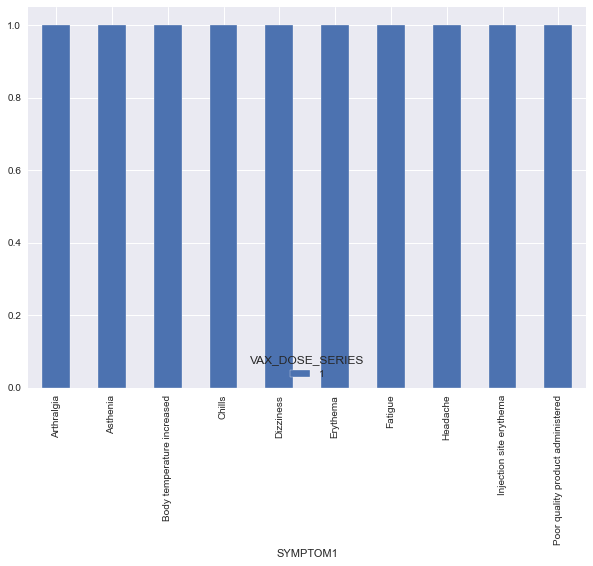

In [418]:
plt.rcParams['figure.figsize'] = (10,7)
pd.crosstab(v_symptom1["SYMPTOM1"],covid_data["VAX_DOSE_SERIES"]).plot(kind='bar',stacked=True)
plt.show()

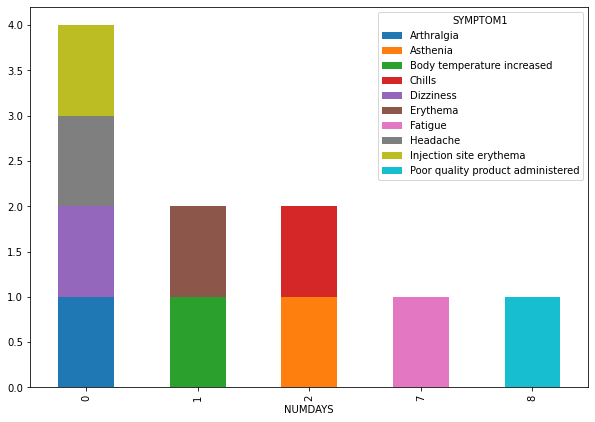

In [29]:
plt.rcParams['figure.figsize'] = (10,7)
pd.crosstab(covid_data["NUMDAYS"],v_symptom1["SYMPTOM1"]).plot(kind='bar',stacked=True)
plt.show()

In [30]:
fig_s = plotly_graph.scatter(covid_data, x="AGE_YRS", y="VAERS_ID", color="SEX")
fig_s.update_layout(
    title_text='Age Distribution by Gender',
    xaxis_title_text='Age of Patients',
    yaxis_title_text='VARES_ID'
)
fig_s.show()

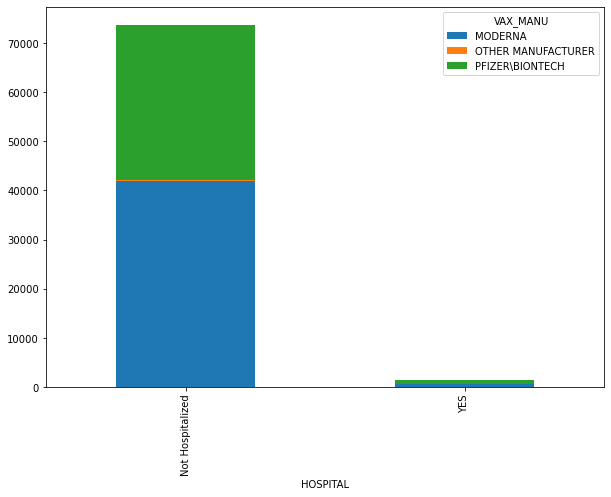

In [31]:
plt.rcParams['figure.figsize'] = (10,7)
pd.crosstab(covid_data["HOSPITAL"],covid_data["VAX_MANU"]).plot(kind='bar',stacked=True)
plt.show()

Now lets analyse the patients who had adverse side effects and were hospitalised

In [32]:
adv_cases = data[(data['HOSPITAL'] == "YES")]

In [33]:
a1_d1 = adv_cases['SYMPTOM1'].value_counts()
adv_symptom = pd.DataFrame({"SYMPTOM1":a1_d1[:10].keys(), "Count":a1_d1[:10].values})
fig1 = plotly_graph.bar(adv_symptom, x='SYMPTOM1', y="Count", title="Adverse effects causing hospitalisation")
fig1.show()

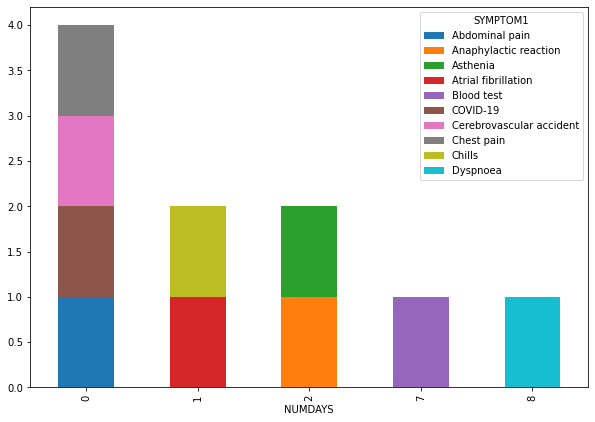

In [34]:
plt.rcParams['figure.figsize'] = (10,7)
pd.crosstab(covid_data["NUMDAYS"],adv_symptom["SYMPTOM1"]).plot(kind='bar',stacked=True)
plt.show()

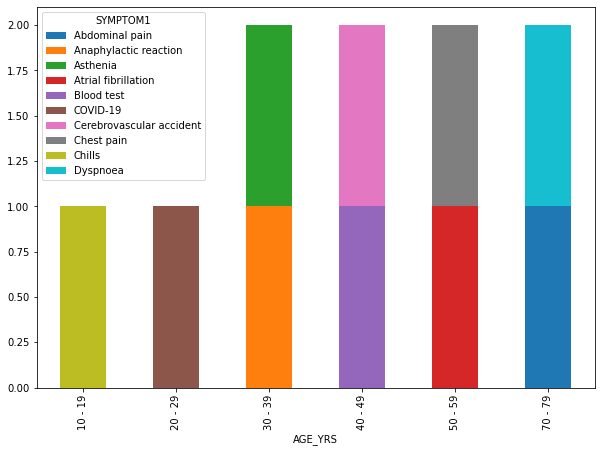

In [35]:
plt.rcParams['figure.figsize'] = (10,7)
pd.crosstab(covid_data["AGE_YRS"],adv_symptom["SYMPTOM1"]).plot(kind='bar',stacked=True)
plt.show()

## Chi Square testing of Categorical Variables


In [36]:
from scipy.stats import chi2_contingency

##Chi square Test for SEX vs RECOVERY

In [37]:
chisqt1 = pd.crosstab(covid_data.SEX, covid_data.RECOVD, margins=True)
print(chisqt1)
stat, p, dof, expected = chi2_contingency(chisqt1)
a_level = 0.05
print("p value is " + str(p))
if p <= a_level:
    print('Dependent (reject null hypothesis H0)')
else:
    print('Independent (Null hypothesis H0 holds true)')

RECOVD      N      U      Y    All
SEX                               
F       20657  14242  23253  58152
M        4598   3619   5835  14052
U         134    810   2033   2977
All     25389  18671  31121  75181
p value is 1.8661199230623875e-290
Dependent (reject null hypothesis H0)


##Chi square Test for AGE vs RECOVERY

In [38]:
chisqt2 = pd.crosstab(covid_data.AGE_YRS,covid_data.RECOVD, margins=True)
print(chisqt2)
stat, p, dof, expected = chi2_contingency(chisqt2)
a_level = 0.05
print("p value is " + str(p))
if p <= a_level:
    print('Dependent (reject null hypothesis H0)')
else:
    print('Independent (Null hypothesis H0 holds true)')

RECOVD       N      U      Y    All
AGE_YRS                            
0 - 9       10     12     26     48
10 - 19    109    291    331    731
20 - 29   3088   2026   3515   8629
30 - 39   5620   3618   6324  15562
40 - 49   5947   5568   8458  19973
50 - 59   4306   2921   5424  12651
60 - 69   3058   2021   3860   8939
70 - 79   2105   1303   2147   5555
80 - 89    889    676    823   2388
90 - 99    244    221    205    670
All      25376  18657  31113  75146
p value is 5.204074033315051e-99
Dependent (reject null hypothesis H0)


In [39]:
chisqt3 = pd.crosstab(covid_data.SYMPTOM1,covid_data.RECOVD, margins=True)
print(chisqt3)
stat, p, dof, expected = chi2_contingency(chisqt3)
a_level = 0.05
print("p value is " + str(p))
if p <= a_level:
    print('Dependent (reject null hypothesis H0)')
else:
    print('Independent (Null hypothesis H0 holds true)')

RECOVD                                        N      U      Y    All
SYMPTOM1                                                            
AST/ALT ratio abnormal                        0      1      0      1
Abdomen crushing                              1      0      0      1
Abdomen scan normal                           0      1      0      1
Abdominal X-ray                               3      2      1      6
Abdominal adhesions                           0      0      1      1
...                                         ...    ...    ...    ...
Wrong patient received product                6      2      2     10
Wrong product administered                    0      8      5     13
Wrong technique in device usage process       0      0      2      2
Wrong technique in product usage process      0      6      1      7
All                                       25389  18671  31121  75181

[1607 rows x 4 columns]
p value is 0.0
Dependent (reject null hypothesis H0)


In [40]:
chisqt4 = pd.crosstab(covid_data.SYMPTOM1,covid_data.VAX_ROUTE, margins=True)
print(chisqt4)
stat, p, dof, expected = chi2_contingency(chisqt4)
a_level = 0.05
print("p value is " + str(p))
if p <= a_level:
    print('Dependent (reject null hypothesis H0)')
else:
    print('Independent (Null hypothesis H0 holds true)')

VAX_ROUTE                                  ID     IM  IN  JET    OT   SC  \
SYMPTOM1                                                                   
AST/ALT ratio abnormal                      0      0   0    0     1    0   
Abdomen crushing                            0      0   0    0     0    1   
Abdomen scan normal                         0      1   0    0     0    0   
Abdominal X-ray                             0      6   0    0     0    0   
Abdominal adhesions                         0      1   0    0     0    0   
...                                       ...    ...  ..  ...   ...  ...   
Wrong patient received product              0      9   0    0     0    0   
Wrong product administered                  0      9   0    0     3    0   
Wrong technique in device usage process     0      0   0    0     2    0   
Wrong technique in product usage process    4      2   0    0     0    1   
All                                       102  52506   1    8  8955  325   

VAX_ROUTE  

## Data Preprocessing for machine learning modelling

In [41]:
covid_data_final = pd.DataFrame([covid_data.SYMPTOM1,covid_data.SYMPTOM2,covid_data.SYMPTOM3,covid_data.SYMPTOM4,covid_data.SYMPTOM5,covid_data.VAX_MANU,covid_data.VAX_DOSE_SERIES,covid_data.VAX_ROUTE,covid_data.VAX_ROUTE,covid_data.STATE,covid_data.AGE_YRS,covid_data.SEX,covid_data.RECOVD]).transpose()

In [42]:
print(covid_data_final)

                           SYMPTOM1                 SYMPTOM2  \
0                         Dysphagia             Epiglottitis   
1                           Anxiety                 Dyspnoea   
2                  Chest discomfort                Dysphagia   
3                         Dizziness                  Fatigue   
4           Injection site erythema  Injection site pruritus   
...                             ...                      ...   
75176                      Migraine         No more Symptoms   
75177  Vaccination site haemorrhage         No more Symptoms   
75178                  Feeling cold             Paraesthesia   
75179                    Chest pain            Hypoaesthesia   
75180              Body temperature                   Chills   

                      SYMPTOM3                 SYMPTOM4  \
0             No more Symptoms         No more Symptoms   
1             No more Symptoms         No more Symptoms   
2            Pain in extremity        Visual impairmen

In [43]:
covid_data_final.to_csv('covid_data_final.csv', index=False)

In [44]:
covid_data_final = pd.read_csv ("/Users/vikassharma/Desktop/covid_data_final.csv")

In [45]:
print(covid_data_final)

                      SYMPTOM1                 SYMPTOM2  \
0                    Dysphagia             Epiglottitis   
1                      Anxiety                 Dyspnoea   
2                    Dizziness                  Fatigue   
3      Injection site erythema  Injection site pruritus   
4          Pharyngeal swelling         No more Symptoms   
...                        ...                      ...   
56505            Hypoaesthesia             Paraesthesia   
56506                 Migraine         No more Symptoms   
56507             Feeling cold             Paraesthesia   
56508               Chest pain            Hypoaesthesia   
56509         Body temperature                   Chills   

                      SYMPTOM3                 SYMPTOM4  \
0             No more Symptoms         No more Symptoms   
1             No more Symptoms         No more Symptoms   
2           Mobility decreased         No more Symptoms   
3      Injection site swelling    Injection site warmth

## Purging the Covid Symptom Variables

In [46]:
def Purge (list,column):
    k=0
    while (k<len(covid_data_final)):
        for i in list:
            if  covid_data_final[column][k] not in list1:
                covid_data_final[column][k]='Others' 
        k=k+1
    return ()

## Defining the Parameters for the Purge Function

In [47]:
# Symptom1
list1=covid_data_final['SYMPTOM1'].value_counts()[:10]
list1=list1.index
# c_symptom1
column1='SYMPTOM1'

# Symptom2
list2=covid_data_final['SYMPTOM2'].value_counts()[:10]
list2=list2.index
#c_symptom2
column2='SYMPTOM2'

# Symptom3
list3=covid_data_final['SYMPTOM3'].value_counts()[:10]
list3=list3.index
# c_symptom3
column3='SYMPTOM3'

# Symptom4
list4=covid_data_final['SYMPTOM4'].value_counts()[:10]
list4=list4.index
# c_Symptom4
column4='SYMPTOM4'

# Symptom5
list5=covid_data_final['SYMPTOM5'].value_counts()[:10]
list5=list5.index
# c_symptom5
column5='SYMPTOM5'

## Execution of Purge Function

In [48]:
Purge(list1,column1)
print('SYMPTOM1 - done')
Purge(list2,column2)
print('SYMPTOM2 - done')
Purge(list3,column3)
print('SYMPTOM3 - done')
Purge(list4,column4)
print('SYMPTOM4 - done')
Purge(list5,column5)
print('SYMPTOM5 - done')

SYMPTOM1 - done
SYMPTOM2 - done
SYMPTOM3 - done
SYMPTOM4 - done
SYMPTOM5 - done


In [49]:
covid_data_final.head()

,SYMPTOM1,SYMPTOM2,SYMPTOM3,SYMPTOM4,SYMPTOM5,VAX_MANU,VAX_DOSE_SERIES,VAX_ROUTE,STATE,AGE_YRS,SEX,RECOVD
0,Others,Others,Others,Others,Others,MODERNA,1,IM,TX,30 - 39,F,Y
1,Others,Others,Others,Others,Others,MODERNA,1,IM,CA,70 - 79,F,Y
2,Dizziness,Fatigue,Others,Others,Others,MODERNA,1,IM,WA,50 - 59,F,Y
3,Injection site erythema,Others,Others,Others,Others,MODERNA,1,IM,TX,40 - 49,F,N
4,Others,Others,Others,Others,Others,MODERNA,1,IM,NV,40 - 49,F,Y


## Label Encoding for Converting Categories to Numeric Levels

In [50]:
from sklearn.preprocessing import LabelEncoder
Len = LabelEncoder()

In [51]:
columns=['SYMPTOM1','SYMPTOM2','SYMPTOM3','SYMPTOM4','SYMPTOM5','VAX_MANU','VAX_DOSE_SERIES','VAX_ROUTE','STATE','AGE_YRS','SEX','RECOVD'] 
for i in columns:
    covid_data_final[i] = Len.fit_transform(covid_data_final[i])

In [52]:
covid_data_final.head()

,SYMPTOM1,SYMPTOM2,SYMPTOM3,SYMPTOM4,SYMPTOM5,VAX_MANU,VAX_DOSE_SERIES,VAX_ROUTE,STATE,AGE_YRS,SEX,RECOVD
0,9,9,9,9,9,0,0,1,48,2,0,1
1,9,9,9,9,9,0,0,1,5,6,0,1
2,4,6,9,9,9,0,0,1,53,4,0,1
3,8,9,9,9,9,0,0,1,48,3,0,0
4,9,9,9,9,9,0,0,1,37,3,0,1


## Defining the Target and Input Variables for decision tree

In [53]:
Target_v = covid_data_final['RECOVD']

In [54]:
Predictor_v = covid_data_final.drop('RECOVD',axis='columns')

In [55]:
Predictor_v

,SYMPTOM1,SYMPTOM2,SYMPTOM3,SYMPTOM4,SYMPTOM5,VAX_MANU,VAX_DOSE_SERIES,VAX_ROUTE,STATE,AGE_YRS,SEX
0,9,9,9,9,9,0,0,1,48,2,0
1,9,9,9,9,9,0,0,1,5,6,0
2,4,6,9,9,9,0,0,1,53,4,0
3,8,9,9,9,9,0,0,1,48,3,0
4,9,9,9,9,9,0,0,1,37,3,0
...,...,...,...,...,...,...,...,...,...,...,...
56505,9,9,9,9,9,2,0,3,5,3,0
56506,9,9,9,9,9,2,0,3,57,2,1
56507,9,9,9,9,9,2,0,3,57,2,0
56508,9,9,9,9,9,2,0,3,31,2,0


# Decision Tree Modelling

Feature selection

In [56]:
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics

In [57]:
# Split dataset in features and target variable
X = Predictor_v # Features
y = Target_v # Target variable

In [58]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [59]:
# Create Decision Tree classifer object
d_tree = DecisionTreeClassifier(criterion="gini", max_depth=3,random_state=2)

In [60]:
# Train Decision Tree Classifer
d_tree = d_tree.fit(X_train,y_train)

In [61]:
# Predict the response for test dataset
y_pred = d_tree.predict(X_test)

In [62]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.5886273815843803


In [63]:
from six import StringIO
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

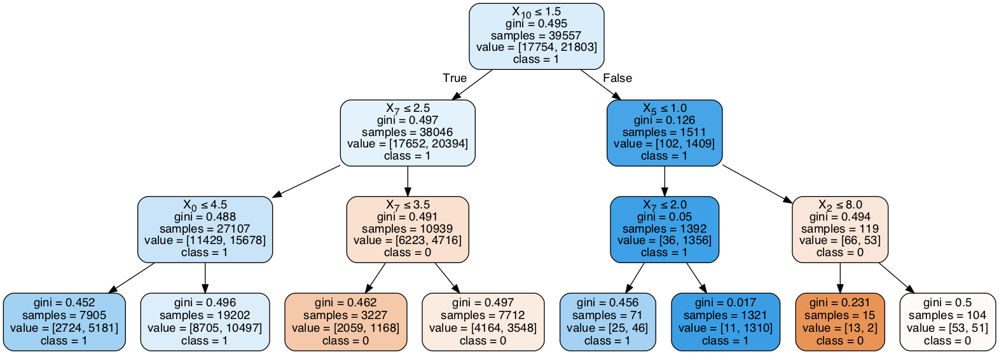

In [64]:
dot_data = StringIO()
export_graphviz(d_tree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = None,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('descision tree.png')
Image(graph.create_png())

In [65]:
# Accuracy on Train
print("Training Accuracy is: ", d_tree.score(X_train, y_train))

# Accuracy on Train
print("Testing Accuracy is: ", d_tree.score(X_test, y_test))

Training Accuracy is:  0.5896048739793209
Testing Accuracy is:  0.5886273815843803


In [66]:
# Confusion Matrix function

def plot_confusion_matrix(cm, classes=None, title='Confusion matrix'):
    """Plots a confusion matrix."""
    if classes is not None:
        sns.heatmap(cm, xticklabels=classes, yticklabels=classes, vmin=0., vmax=1., annot=True, annot_kws={'size':50})
    else:
        sns.heatmap(cm, vmin=0., vmax=1.)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [67]:
y_pred = d_tree.predict(X_train)

In [68]:
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix, r2_score

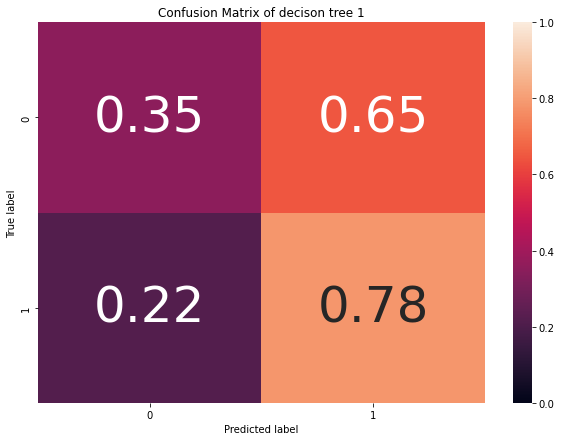

In [69]:
cm_dt = confusion_matrix(y_train, y_pred)
cm_dt_norm = cm_dt/cm_dt.sum(axis=1)[:, np.newaxis]
plt.figure()
plot_confusion_matrix(cm_dt_norm, classes=d_tree.classes_, title='Confusion Matrix of decison tree 1')

In [70]:
 #Calculating False Positives (FP), False Negatives (FN), True Positives (TP) & True Negatives (TN)
FP = cm_dt.sum(axis=0) - np.diag(cm_dt)  
FN = cm_dt.sum(axis=1) - np.diag(cm_dt)
TP = np.diag(cm_dt)
TN = cm_dt.sum() - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print ("The True Positive rate / Recall per class is: ",TPR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print ("The Precision per class is: ",PPV)

# False positive rate or False alarm rate
FPR = FP/(FP+TN)
print ("The False Alarm rate per class is: ",FPR)

# False negative rate or Miss Rate
FNR = FN/(TP+FN)
print ("The Miss Rate rate per class is: ",FNR)

# Classification error
CER = (FP+FN)/(TP+FP+FN+TN)
print ("The Classification error of each class is", CER)

# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print ("The Accuracy of each class is", ACC)
print("")

##Total averages :
print ("The average Recall : ",TPR.sum()/2)
print ("The average Precision : ",PPV.sum()/2)
print ("The average False Alarm : ",FPR.sum()/2)
print ("The average Miss Rate rate : ",FNR.sum()/2)
print ("The average Classification error :", CER.sum()/2)
print ("The average Accuracy :", ACC.sum()/2)

The True Positive rate / Recall per class is:  [0.35423003 0.78126863]
The Precision per class is:  [0.56872852 0.59770518]
The False Alarm rate per class is:  [0.21873137 0.64576997]
The Miss Rate rate per class is:  [0.64576997 0.21873137]
The Classification error of each class is [0.41039513 0.41039513]
The Accuracy of each class is [0.58960487 0.58960487]

The average Recall :  0.5677493327128272
The average Precision :  0.5832168524873785
The average False Alarm :  0.4322506672871728
The average Miss Rate rate :  0.4322506672871728
The average Classification error : 0.410395126020679
The average Accuracy : 0.5896048739793209


Important varibales with decison tree

In [71]:
d_tree.feature_importances_

array([0.12593354, 0.        , 0.00317823, 0.        , 0.        ,
       0.05828881, 0.        , 0.37819437, 0.        , 0.        ,
       0.43440505])

In [72]:
d_tree_ip = pd.DataFrame({'Labels':Predictor_v.columns,'Feature Importance':d_tree.feature_importances_})

In [73]:
d_tree_ip1 = d_tree_ip.sort_values(by='Feature Importance',ascending=False)
d_tree_ip1

,Labels,Feature Importance
10,SEX,0.434405
7,VAX_ROUTE,0.378194
0,SYMPTOM1,0.125934
5,VAX_MANU,0.058289
2,SYMPTOM3,0.003178
1,SYMPTOM2,0.000000
3,SYMPTOM4,0.000000
4,SYMPTOM5,0.000000
6,VAX_DOSE_SERIES,0.000000
8,STATE,0.000000


<function matplotlib.pyplot.show(close=None, block=None)>

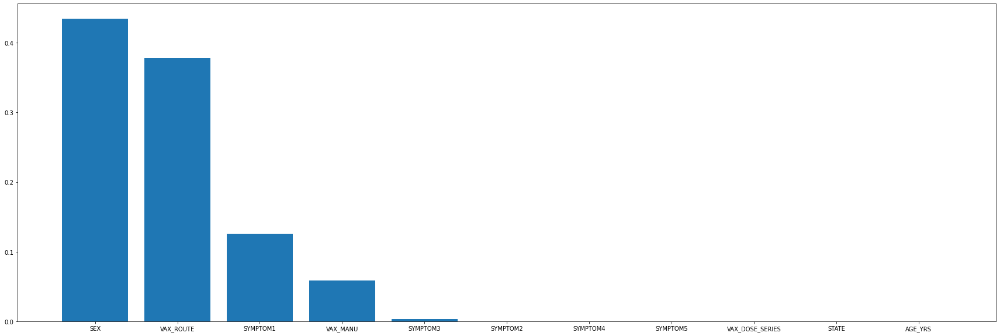

In [74]:
plt.rcParams['figure.figsize'] = (30,10)
plt.bar(d_tree_ip1['Labels'],d_tree_ip1['Feature Importance'],)
plt.show

## Decision tree based on Important Features

In [75]:
Predictor_v2 = covid_data_final.drop(['RECOVD','SYMPTOM3','SYMPTOM4','AGE_YRS','SYMPTOM5','STATE','VAX_DOSE_SERIES'],axis='columns')
Predictor_v2

,SYMPTOM1,SYMPTOM2,VAX_MANU,VAX_ROUTE,SEX
0,9,9,0,1,0
1,9,9,0,1,0
2,4,6,0,1,0
3,8,9,0,1,0
4,9,9,0,1,0
...,...,...,...,...,...
56505,9,9,2,3,0
56506,9,9,2,3,1
56507,9,9,2,3,0
56508,9,9,2,3,0


In [76]:
X = Predictor_v2 # Features
y = Target_v #Target Variable

In [77]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(Predictor_v2, Target_v, test_size=0.3, random_state=1) # 70% training and 30% test
d_tree2 = DecisionTreeClassifier(criterion="entropy", max_depth=5)
d_tree2 = d_tree2.fit(X_train2,y_train2)
y_pred2 = d_tree2.predict(X_test2)
print("Accuracy:",metrics.accuracy_score(y_test2, y_pred2))

Accuracy: 0.6206571108358403


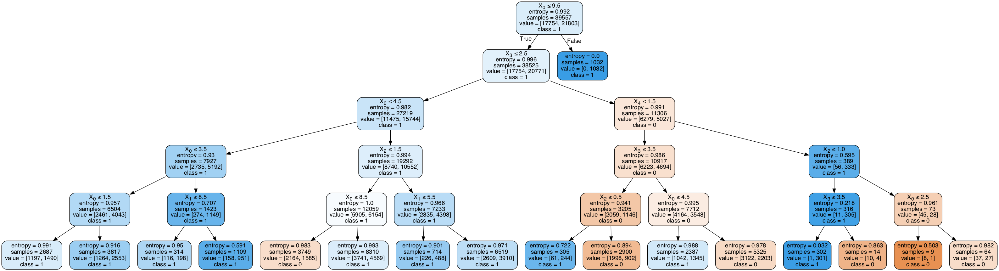

In [78]:
#Plotting the decision tree with important variable
dot_data = StringIO()
export_graphviz(d_tree2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = None,class_names=['0','1'])
graph2 = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph2.write_png('decision tree2.png')
Image(graph2.create_png())

In [79]:
# Accuracy on Train
print("Training Accuracy is: ", d_tree2.score(X_train2, y_train2))

# Accuracy on Test
print("Testing Accuracy is: ", d_tree2.score(X_test2, y_test2))

Training Accuracy is:  0.6173370073564729
Testing Accuracy is:  0.6206571108358403


In [80]:
y_pred2 = d_tree2.predict(X_train2)

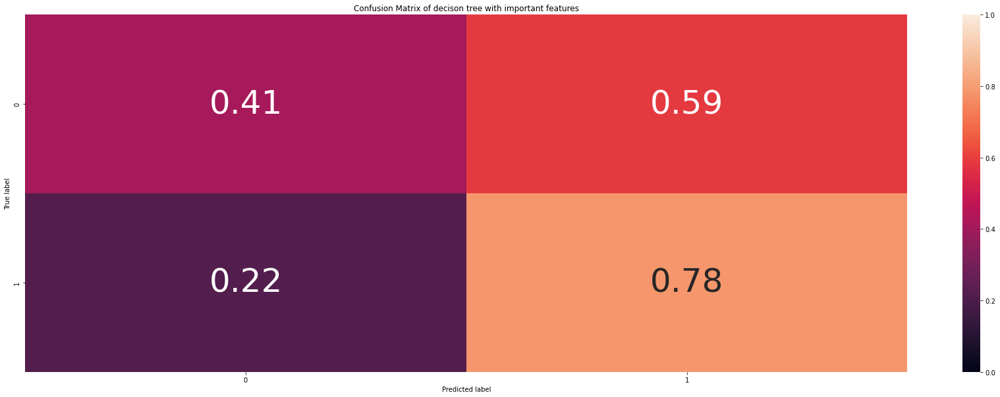

In [81]:
cm_dt2 = confusion_matrix(y_train2, y_pred2)
cm_dt2_norm = cm_dt2/cm_dt2.sum(axis=1)[:, np.newaxis]
plt.figure()
plot_confusion_matrix(cm_dt2_norm, classes=d_tree2.classes_, title='Confusion Matrix of decison tree with important features')

In [82]:
FP = cm_dt2.sum(axis=0) - np.diag(cm_dt2)  
FN = cm_dt2.sum(axis=1) - np.diag(cm_dt2)
TP = np.diag(cm_dt2)
TN = cm_dt2.sum() - (FP + FN + TP)

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print ("The True Positive rate / Recall per class is: ",TPR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print ("The Precision per class is: ",PPV)

# False positive rate or False alarm rate
FPR = FP/(FP+TN)
print ("The False Alarm rate per class is: ",FPR)

# False negative rate or Miss Rate
FNR = FN/(TP+FN)
print ("The Miss Rate rate per class is: ",FNR)

# Classification error
CER = (FP+FN)/(TP+FP+FN+TN)
print ("The Classification error of each class is", CER)

# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print ("The Accuracy of each class is", ACC)
print("")

##Total averages :
print ("The average Recall : ",TPR.sum()/2)
print ("The average Precision : ",PPV.sum()/2)
print ("The average False Alarm : ",FPR.sum()/2)
print ("The average Miss Rate rate : ",FNR.sum()/2)
print ("The average Classification error :", CER.sum()/2)
print ("The average Accuracy :", ACC.sum()/2)

The True Positive rate / Recall per class is:  [0.41337163 0.7834243 ]
The Precision per class is:  [0.60849017 0.62121763]
The False Alarm rate per class is:  [0.2165757  0.58662837]
The Miss Rate rate per class is:  [0.58662837 0.2165757 ]
The Classification error of each class is [0.38266299 0.38266299]
The Accuracy of each class is [0.61733701 0.61733701]

The average Recall :  0.598397966984782
The average Precision :  0.614853903299774
The average False Alarm :  0.401602033015218
The average Miss Rate rate :  0.401602033015218
The average Classification error : 0.38266299264352704
The average Accuracy : 0.6173370073564729



## Random Forest Modelling

In [83]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [84]:
rf_cls=RandomForestClassifier(n_estimators=100,criterion='entropy')
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y, test_size=0.3)

In [85]:
rf_cls1=rf_cls.fit(X_train_rf,y_train_rf)
y_pred_rf=rf_cls1.predict(X_test_rf)

In [86]:
# Accuracy on Test
print("Training Accuracy is: ", rf_cls.score(X_train_rf, y_train_rf))
# Accuracy on Train
print("Testing Accuracy is: ", rf_cls.score(X_test_rf, y_test_rf))

Training Accuracy is:  0.6432995424324393
Testing Accuracy is:  0.6358166696159971


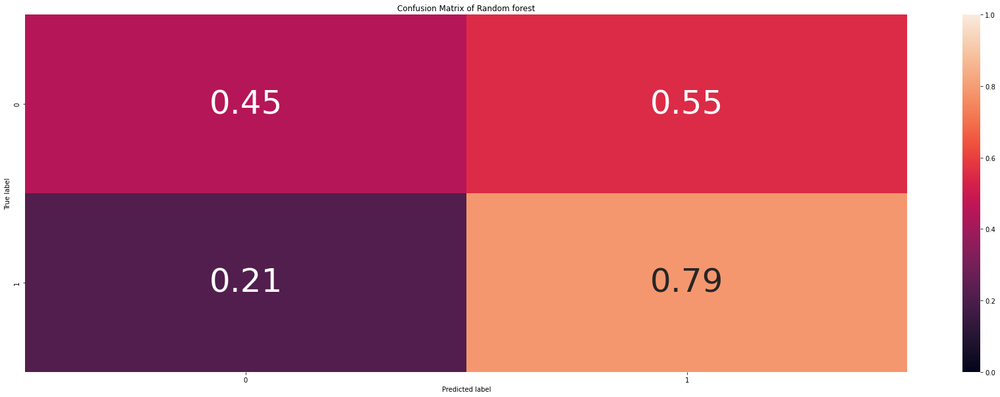

In [87]:
cm_rf = confusion_matrix(y_test_rf, y_pred_rf)
cm_rf_norm = cm_rf/cm_rf.sum(axis=1)[:, np.newaxis]
plt.figure()
plot_confusion_matrix(cm_rf_norm, classes=rf_cls1.classes_,title='Confusion Matrix of Random forest')

In [88]:
FP = cm_rf.sum(axis=0) - np.diag(cm_rf)  
FN = cm_rf.sum(axis=1) - np.diag(cm_rf)
TP = np.diag(cm_rf)
TN = cm_rf.sum() - (FP + FN + TP)

In [89]:
# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
print ("The True Positive rate / Recall per class is: ",TPR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print ("The Precision per class is: ",PPV)

# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print ("The Accuracy of each class is", ACC)
print("")


The True Positive rate / Recall per class is:  [0.44556559 0.7879206 ]
The Precision per class is:  [0.62682107 0.63996896]
The Accuracy of each class is [0.63581667 0.63581667]



In [90]:
print ("The average Recall : ",TPR.sum()/2)
print ("The average Precision : ",PPV.sum()/2)
print ("The average Accuracy :", ACC.sum()/2)

The average Recall :  0.6167430948689617
The average Precision :  0.6333950156008645
The average Accuracy : 0.6358166696159971


Classification accuracy on test set with max features = 1 and max_depth = None: 0.521
Classification accuracy on test set with max features = 1 and max_depth = 2: 0.539
Classification accuracy on test set with max features = 1 and max_depth = 3: 0.539
Classification accuracy on test set with max features = 1 and max_depth = 4: 0.533
Classification accuracy on test set with max features = 1 and max_depth = 5: 0.531
Classification accuracy on test set with max features = sqrt and max_depth = None: 0.521
Classification accuracy on test set with max features = sqrt and max_depth = 2: 0.538
Classification accuracy on test set with max features = sqrt and max_depth = 3: 0.530
Classification accuracy on test set with max features = sqrt and max_depth = 4: 0.530
Classification accuracy on test set with max features = sqrt and max_depth = 5: 0.524
Classification accuracy on test set with max features = log2 and max_depth = None: 0.521
Classification accuracy on test set with max features = log2

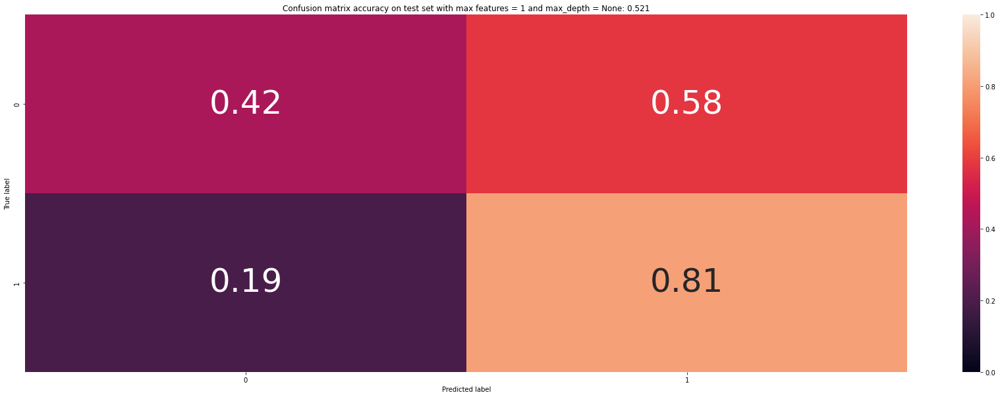

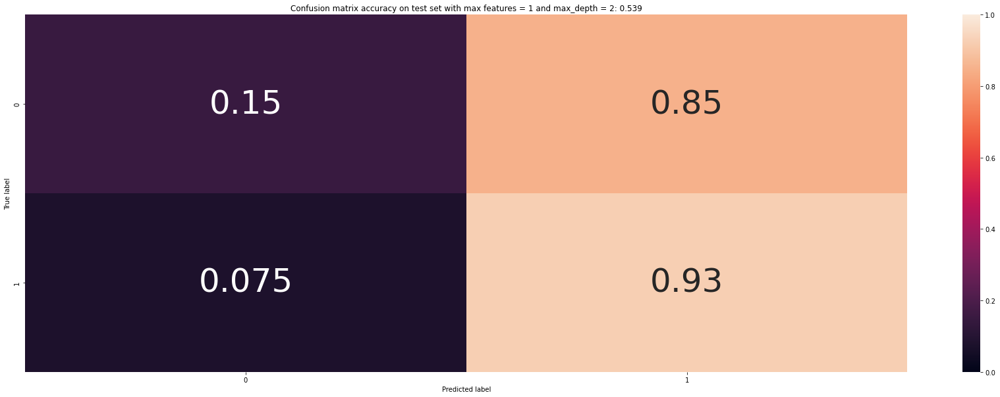

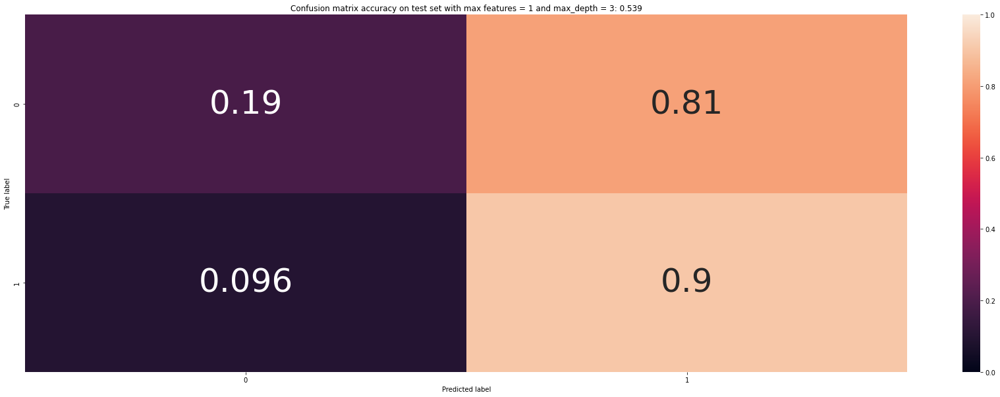

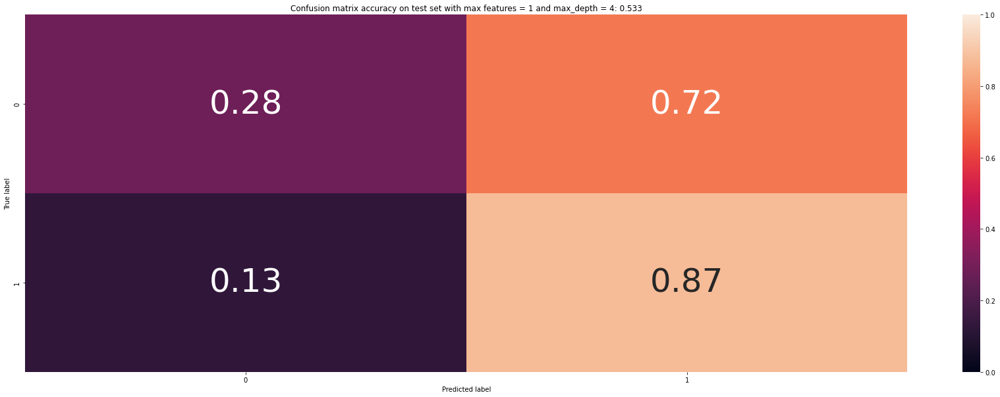

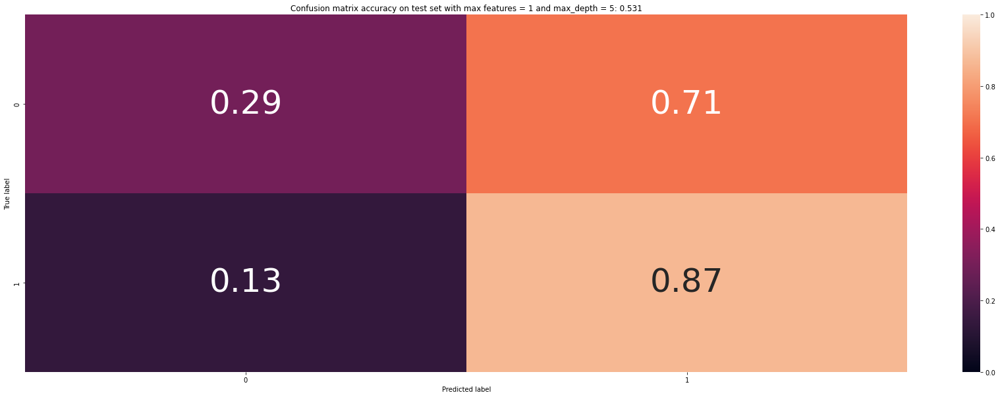

...

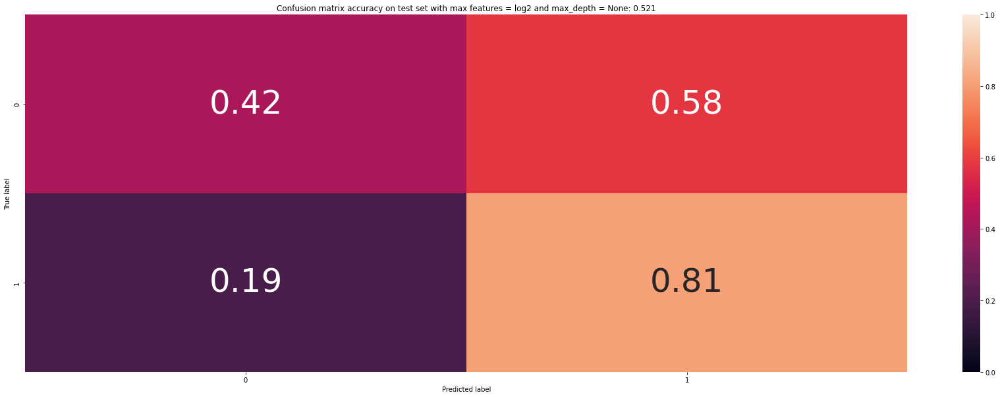

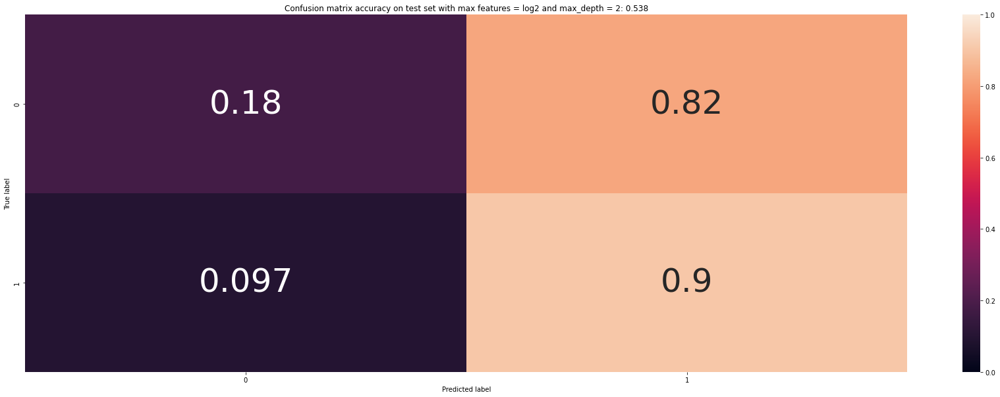

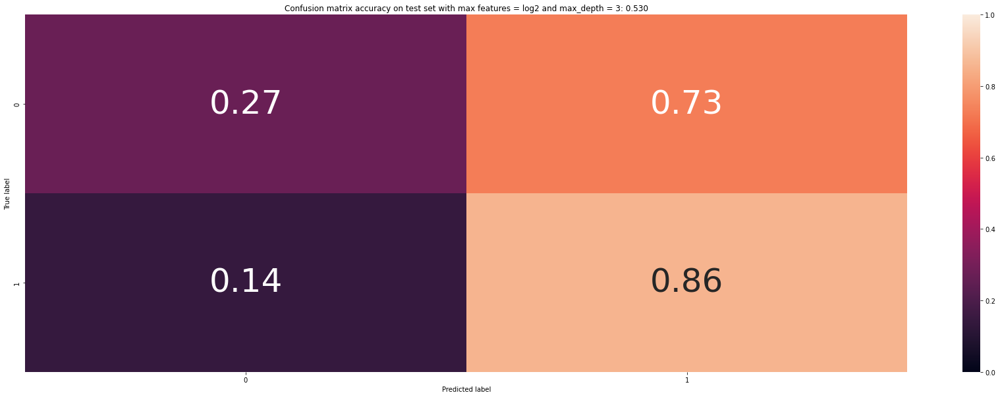

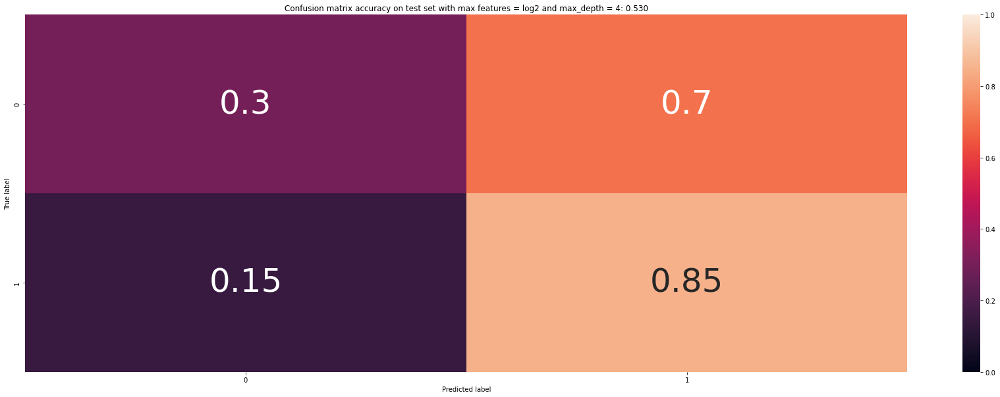

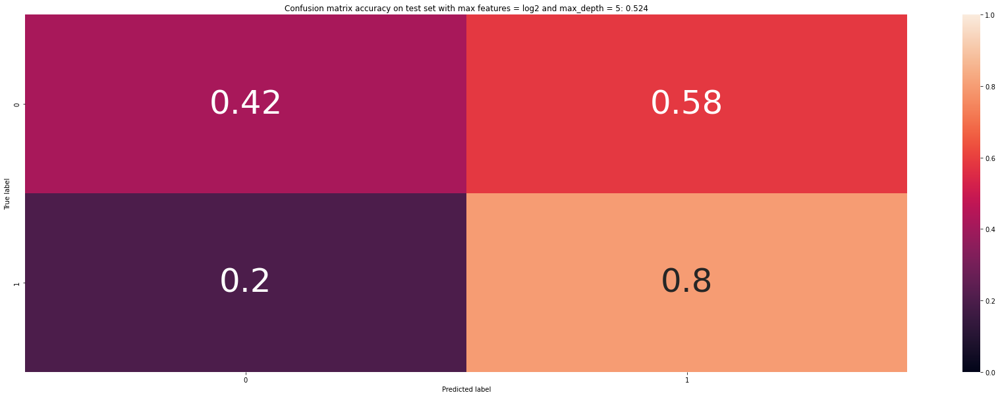

In [91]:
# Tunning Random Forest

from itertools import product
n_estimators = 100
max_features = [1, 'sqrt', 'log2']
max_depths = [None, 2, 3, 4, 5]
for f, d in product(max_features, max_depths): 
    rf = RandomForestClassifier(n_estimators=n_estimators, 
                                criterion='entropy', 
                                max_features=f, 
                                max_depth=d, 
                                n_jobs=2,
                                random_state=1337)
    rf.fit(X_train_rf, y_train_rf)
    prediction_test = rf.predict(X=X_test_rf)
    print('Classification accuracy on test set with max features = {} and max_depth = {}: {:.3f}'.format(f, d, accuracy_score(y_test,prediction_test)))
    cm = confusion_matrix(y_test_rf, prediction_test)
    cm_norm = cm/cm.sum(axis=1)[:, np.newaxis]
    plt.figure()
    plot_confusion_matrix(cm_norm, classes=rf.classes_,
    title='Confusion matrix accuracy on test set with max features = {} and max_depth = {}: {:.3f}'.format(f, d, accuracy_score(y_test,prediction_test)))

## Logistic Regression


In [152]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score, explained_variance_score, confusion_matrix, accuracy_score, classification_report, log_loss
from math import sqrt

In [276]:
log_reg1 = LogisticRegression(random_state= 4 ,solver = 'saga')
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X, y, test_size=0.3)

log_reg1.fit(X_train_lr, y_train_lr)

LogisticRegression(random_state=4, solver='saga')

In [277]:
log_reg1.predict(X_train_lr)
y_pred_lr = log_reg1.predict(X_train_lr)

In [278]:
print("The Training Accuracy is: ", log_reg1.score(X_train_lr, y_train_lr))
print("The Testing Accuracy is: ", log_reg1.score(X_test_lr, y_test_lr))


The Training Accuracy is:  0.5744116085648557
The Testing Accuracy is:  0.5805462160089659


In [298]:
log_coeff = log_reg1.coeff

AttributeError: 'LogisticRegression' object has no attribute 'coeff'

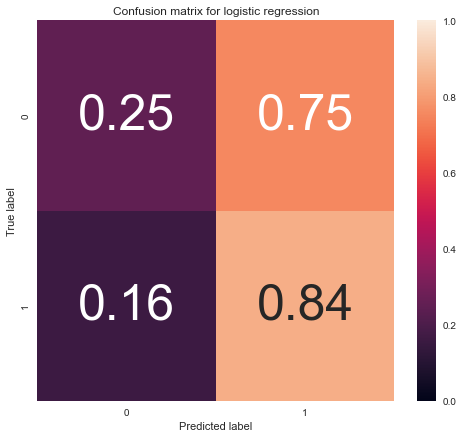

In [379]:
cm_lr = confusion_matrix(y_train_lr, y_pred_lr)
cm_lr_norm = cm_lr / cm_lr.sum(axis=1).reshape(-1,1)

plot_confusion_matrix(cm_lr_norm, classes = log_reg1.classes_, title='Confusion matrix for logistic regression')

In [96]:
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test_lr, lry_pred)
cnf_matrix

array([[1925, 5668],
       [1461, 7899]])

In [255]:
FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)  
FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
TP = np.diag(cnf_matrix)
TN = cnf_matrix.sum() - (FP + FN + TP)

In [256]:
TPR = TP/(TP+FN)
print ("The True Positive rate / Recall per class is: ",TPR)

# Precision or positive predictive value
PPV = TP/(TP+FP)
print ("The Precision per class is: ",PPV)

# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)
print ("The Accuracy of each class is", ACC)
print("")

The True Positive rate / Recall per class is:  [0.25352298 0.84391026]
The Precision per class is:  [0.56851742 0.58222157]
The Accuracy of each class is [0.57948446 0.57948446]



In [257]:
print ("The average Recall : ",TPR.sum()/2)
print ("The average Precision : ",PPV.sum()/2)
print ("The average Accuracy :", ACC.sum()/2)

The average Recall :  0.5487166190519608
The average Precision :  0.5753694958637823
The average Accuracy : 0.5794844570282546


# XGBOOST


In [223]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np
X_train_xg, X_test_xg, y_train_xg, y_test_xg = train_test_split(X, y, test_size=0.3)
xg_cls = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)

In [224]:
xg_cls = xg_cls.fit(X_train_xg,y_train_xg)

preds = xg_cls.predict(X_test_xg)

In [225]:
rmse = np.sqrt(mean_squared_error(y_test_xg, preds))
print("RMSE: %f" % (rmse))

RMSE: 0.486584


In [226]:
from sklearn.metrics import accuracy_score

In [227]:
print("The Training Accuracy is: ", xg_cls.score(X_train_xg, y_train_xg))
print("The Testing Accuracy is: ", xg_cls.score(X_test_xg, y_test_xg))

The Training Accuracy is:  0.046889824902435207
The Testing Accuracy is:  0.042919116003560354


# Knn technique

In [228]:
from sklearn.neighbors import KNeighborsClassifier

In [388]:
knn = KNeighborsClassifier(n_neighbors=15)

In [389]:
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X, y, test_size=0.3) # 70% training and 30% test

In [390]:
knn.fit(X_train_knn, y_train_knn)

KNeighborsClassifier(n_neighbors=15)

In [391]:
y_pred_knn = knn.predict(X_test_knn)

In [392]:
print("The Training Accuracy is: ", knn.score(X_train_knn, y_train_knn))
print("The Testing Accuracy is: ", knn.score(X_test_knn, y_test_knn))

The Training Accuracy is:  0.6272973177945749
The Testing Accuracy is:  0.619949271515366


In [386]:
from sklearn.model_selection import cross_val_score
neighbours = []
cv_scores = []

In [387]:
for k in range (1,51,2):
    neighbours.append(k)
    knn= KNeighborsClassifier(n_neighbors=k)
    scores= cross_val_score(knn,X_train_knn,y_train_knn,cv=10,scoring='accuracy')
    cv_scores.append(scores.mean())

In [317]:
scores = cross_val_score(knn,X,y,cv=10,scoring='accuracy')
print(scores)

[0.54043532 0.61369669 0.61263493 0.62980004 0.61688197 0.63050787
 0.65510529 0.62449124 0.6228986  0.62254468]


In [331]:
import matplotlib.pyplot as plt

In [337]:
MSE =[1-x for x in cv_scores]
optimal_k =neighbours [MSE.index(min(MSE))]
print(" Optimal numbers of neighbours are =%d" %optimal_k)

 Optimal numbers of neighbours are =31


In [376]:
from sklearn.metrics import classification_report

In [393]:
print('Classification Report for Knn : \n\n')
print(classification_report(y_test_knn,y_pred_knn))

Classification Report for Knn : 


              precision    recall  f1-score   support

           0       0.60      0.44      0.51      7587
           1       0.63      0.77      0.69      9366

    accuracy                           0.62     16953
   macro avg       0.62      0.60      0.60     16953
weighted avg       0.62      0.62      0.61     16953



# K fold cross validation for all models evaluation

Decision tree k-fold validation

In [105]:
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score
from sklearn import linear_model, tree, ensemble

In [106]:
kf = StratifiedKFold(n_splits=8, shuffle=True, random_state=42)
cnt = 1
for train_index, test_index in kf.split(X, y):
    print(f'Fold:{cnt}, Train set: {len(train_index)}, Test set:{len(test_index)}')
    cnt+=1

Fold:1, Train set: 49446, Test set:7064
Fold:2, Train set: 49446, Test set:7064
Fold:3, Train set: 49446, Test set:7064
Fold:4, Train set: 49446, Test set:7064
Fold:5, Train set: 49446, Test set:7064
Fold:6, Train set: 49446, Test set:7064
Fold:7, Train set: 49447, Test set:7063
Fold:8, Train set: 49447, Test set:7063


In [107]:
dt1_score = cross_val_score(tree.DecisionTreeClassifier(random_state= 42), X, y, cv= kf, scoring="accuracy")
print(f'Scores for each fold are: {dt1_score}')
print(f'Average score: {"{:.2f}".format(dt1_score.mean())}')

Scores for each fold are: [0.63335221 0.63505096 0.62740657 0.64113817 0.62514156 0.63278596
 0.6274954  0.6316013 ]
Average score: 0.63


Decision tree with important variables

In [108]:
dt2_score = cross_val_score(tree.DecisionTreeClassifier(random_state= 30), Predictor_v2, Target_v, cv= kf, scoring="accuracy")
print(f'Scores for each fold are: {dt2_score}')
print(f'Average score: {"{:.2f}".format(dt2_score.mean())}')

Scores for each fold are: [0.63335221 0.63505096 0.62740657 0.64113817 0.62514156 0.63278596
 0.6274954  0.6316013 ]
Average score: 0.63


Random Forest Cross-Validation

In [109]:
rf_score = cross_val_score(ensemble.RandomForestClassifier(random_state= 10), X, y, cv= kf, scoring="accuracy")
print(f'Scores for each fold are: {rf_score}')
print(f'Average score: {"{:.2f}".format(rf_score.mean())}')

Scores for each fold are: [0.63321065 0.63448471 0.62853907 0.64255379 0.62372593 0.63292752
 0.6274954  0.63174289]
Average score: 0.63


In [110]:
max_depth = [1,2,3,4,5,6,7,8,9,10]
for val in max_depth:
    score = cross_val_score(tree.DecisionTreeClassifier(max_depth= val, random_state= 42), X, y, cv= kf, scoring="accuracy")
    print(f'Average score({val}): {"{:.3f}".format(score.mean())}')

Average score(1): 0.551
Average score(2): 0.589
Average score(3): 0.588
Average score(4): 0.598
Average score(5): 0.616
Average score(6): 0.620
Average score(7): 0.631
Average score(8): 0.633
Average score(9): 0.634
Average score(10): 0.633


In [111]:
n_estimators = [50, 100, 150, 200, 250, 300, 350]
for val in n_estimators:
    score = cross_val_score(ensemble.RandomForestClassifier(n_estimators= val, random_state= 42), X, y, cv= kf, scoring="accuracy")

Logistic Regression Cross Validation

In [112]:
lr_score = cross_val_score(LogisticRegression(), X, y, cv= kf, scoring="accuracy")
print(f'Scores for each fold are: {lr_score}')
print(f'Average score: {"{:.2f}".format(lr_score.mean())}')

Scores for each fold are: [0.58069083 0.5765855  0.57502831 0.58111552 0.58069083 0.57205549
 0.57907405 0.57100382]
Average score: 0.58


## Model comparisons

In [363]:
dt2_ascore = d_tree2.score(X_train2, y_train2)
lr_score = log_reg1.score(X_train_lr, y_train_lr)
rf_ascore = rf_cls.score(X_train_rf, y_train_rf)
knn_score = knn.score(X_train_knn, y_train_knn)


In [364]:
a_scores = [ dt2_ascore , lr_score , rf_ascore,knn_score]

In [365]:
a_scores

[0.6173370073564729,
 0.5744116085648557,
 0.6432995424324393,
 0.6240867608767096]

In [366]:
m_names = ['decision_tree','logistic _regression','random_forest','k_nearest neighbours']

In [367]:
model_scores = pd.DataFrame()
model_scores['m_name'] = m_names
model_scores['a_scores'] = a_scores
model_scores

,m_name,a_scores
0,decision_tree,0.617337
1,logistic _regression,0.574412
2,random_forest,0.643300
3,k_nearest neighbours,0.624087


In [368]:
cm = sns.light_palette("green", as_cmap=True)
s = model_scores.style.background_gradient(cmap=cm)
s

,m_name,a_scores
0,decision_tree,0.617337
1,logistic _regression,0.574412
2,random_forest,0.643300
3,k_nearest neighbours,0.624087


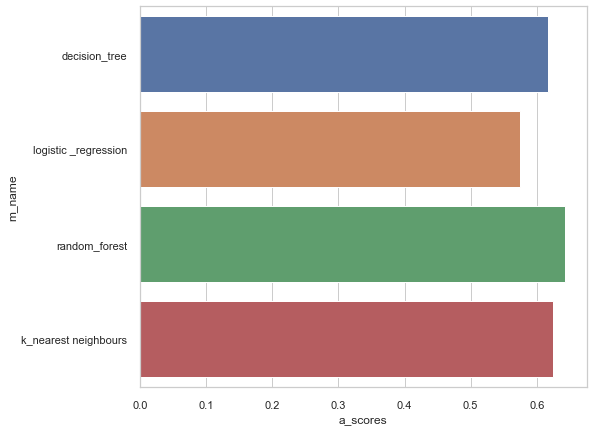

In [369]:
sns.set(style="whitegrid")
ax = sns.barplot(y="m_name", x="a_scores", data=model_scores)

# AUC and ROC Curve

 ## All machine learning models


In [370]:
from sklearn.metrics import roc_curve

In [371]:
pred_prob1 = d_tree2.predict_proba(X_test2)
pred_prob2 = logreg.predict_proba(X_test_lr)
pred_prob3 = rf_cls.predict_proba(X_test_rf)
pred_prob4 = knn.predict_proba(X_test_knn)
fpr1, tpr1, thresh1 = roc_curve(y_test2, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test_lr, pred_prob2[:,1], pos_label=1)
fpr3, tpr3, thresh3 = roc_curve(y_test_rf, pred_prob3[:,1], pos_label=1)
fpr4, tpr4, thresh4 = roc_curve(y_test_knn, pred_prob4[:,1], pos_label=1)

In [372]:
random_probs = [0 for i in range(len(y_test2))]
p_fpr, p_tpr, _ = roc_curve(y_test2, random_probs, pos_label=1)

In [373]:
import matplotlib.pyplot as plt
plt.style.use('seaborn')

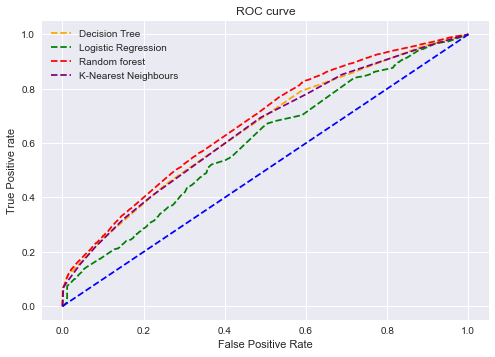

In [374]:
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Decision Tree')
plt.plot(fpr2, tpr2, linestyle='--',color='green', label='Logistic Regression')
plt.plot(fpr3, tpr3, linestyle='--',color='red', label='Random forest')
plt.plot(fpr4, tpr4, linestyle='--',color='purple', label='K-Nearest Neighbours')

plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.rcParams['figure.figsize'] = (8,7)
plt.show();

## AUC CURVE for models